# Day 2 - Morning

# Deep Learning

In this section of the course we will discuss Deep Learning. 

Deep Learning is fundamentally different to classical machine learning in a few ways. First, it is normally applied to non-tabular data. We mostly use deep learning for image data, 

Also, in Deep Learning, you are normally not very interested in feature engineering. That is to say, we generally do not select features or perform feature engineering - we in fact allow the network to learn which features are important all by itself. 

Normally, in the problems we discussed yesterday, we carefully selected features, removed features, or acquired datasets where features were curated in order for 

I will illustrate this with a demo:

<https://playground.tensorflow.org>

In the playground, we will

1. Mimick feature engineering (all except $\sin$) and train a network using these features and 8 neurons on the swiss roll data
2. Remove all engineered features and instead use multiple layers, achieving the same thing (ensure the use of ReLU activation function)

As we saw, adding layers upon layers allows the network to learn very complex functions. 

We will look at an example of MNIST (Modified National Institute of Standards and Technology) dataset demonstrates this very well. 

Imagine you had a house price dataset. Well the features are quite easy to understand, and you could probably easily remove features that were not important, such as house colour, or street number. 

This also means there is far less domain knowledge required to train neural networks. You might not neccessarily need to know the details of your data in order to train something - for example in medicine, you might not have to know the details of the RNA sequence data that you wish to classify. 

## Why *Deep* Learning?

So, neural networks have been around for decades, and for many years were actually ignored. It is only recently that we have seen a resurgance of interest in neural networks and specifically the rise in **deep** learning. 

This has happened for 2 main reasons

1. We have become very good at gathering lots of data
2. Hardware has become very powerful at training neural networks

This has led to networks getting larger and larger, meaning they can perform ever more complex tasks. In many fields, such as image classificaiton, they are in a class of their own in terms of capabilities, as is the case with machine translation, image generation, image segmentation, and so on.

This brings up a further point: hardware. Neural networks require lots of computing power to train, and it turns out that the devices that are best suited for performing the calculations required to train a neural network are in fact GPUs (graphics processing units) and not CPUs. Most computers, especially laptops, do not have a dedicated GPU that is powerful enough to train neural networks. However, it is still possible to train networks using a PC's CPU, it is magnitudes slower.

However, for smaller datasets, as we will see here, training can be performed on a CPU. For example training a small network that has to classify small images can be trained on a normal PC or laptop. 

Second, there are ways to get a GPU for free to perform training tasks. For example, Google Colab offers GPUs for free, and I will demo this later.

### Areas Where Deep Learning is Used

Neural Networks and Deep Learning algorithms can be applied to nearly any type of problem, but they are more suited to some problems than others. For example, they tend not to be used for tabular/text data, such as those we discussed yesterday, where algorithms like random forests can still outperform them. See for example the paper: Grinsztajn L, Oyallon E, Varoquaux G. Why do tree-based models still outperform deep learning on tabular data? arXiv: <http://arxiv.org/abs/2207.08815>

So in this section we will concentrate on deep learning for image analysis, and specifically image classification. In medicine, deep learning is mostly used for image classification or image segmentation. In this seminar, we will demo image classification, but we will also discuss how segmentation is performed.  

Here are some of the fields and areas where deep learning is very successful

- NLP: In natural language processing (NLP), networks have been trained at answering questions, speech recognition, document summarisation, document classification 
- Computer vision: Satellite imagery interpretation, face recognition, image captioning, reading traffic signs, highlighting and recognising pedestrians and vehicles in autonomous vehicles 
- Medicine:: Finding anomalies in radiology images, including CT, MRI, and X-ray images; counting features in pathology slides; measuring features in ultrasounds; diagnosing diabetic retinopath- y
- Biology:: protein folding (DeepMind), classifying proteins, genomics tasks, protein/protein interactions
- Image generation: Colorising images, increasing image resolution (super resolution), de-noising/removing noise from images, converting images to art in the style of famous artists
- Recommendation systems: product recommendations, film recommendations, music recommendations
- Playing games: Chess, Go, Atari video games, and many real-time strategy games
- Robotics: Boston Dyamics robots that can run, climb, and so on.

(Some of the points above from: <https://course.fast.ai> which provides some very good introductory material on Deep Learning.)

Also see this dataset: <https://www.robots.ox.ac.uk/~vgg/data/pets/>

## Funny Joke

Deep learning has moved very fast in the past few years. Here is an example from the comic xkcd:

<img src="./img/task.png" width="400"/>

*Source*: <https://xkcd.com/1425/>

This comic is not particulary old, and the text suggests that to build a system that can recognise birds would be 'virtually impossible', yet what we will see now is that in fact, we can perform a classification of this type very quickly, and we will do so during this course.

## How Neural Networks Work

Here we will describe briefly the concepts behind neural networks. 

They are called neural networks because they are based on the idea of neurons and loosely mimick the neurons in the (human) brain.

![neuron](./img/chapter7_neuron.png)

*Source*: <https://colab.research.google.com/github/fastai/fastbook/blob/master/01_intro.ipynb>

The neuron in neural network is based loosely on the biological neuron. In a neural network, we have a lot of interconnected neurons organised in layers, where neurons can fire or not fire based on their inputs and a weight. The weight associated with the neuron controls if it fires or not, and these weights are adjusted (or learned) during the training of the network. Ultimately, a network's ability to perform some function is based on the firing of these neurons. The neuron fires based on a threshold which is controlled by something called an activation function. By 'fires' we mean it outputs something (a value). The threshold is controlled using a weight. These weights are what are learned when the network is training. So what the network learns, is which neurons should fire and which should not.

These weights are updated when you train the network. During training you pass data through the network, and the weights are updated based on the error or loss of the network. If the error is very high for a given prediction during training, these weights are nudged more than if the error was very small.

Hopefully you now have some understanding how neural networks work, and how they are trained. Check the TensorFlow Playground website again if you wish to visually 

---
# PyTorch

There are a number of frameworks available for neural network development:

- PyTorch (which we will use during this course), from Facebook
- TensorFlow, from Google
- Keras (front-end for TensorFlow and PyTorch, higher level API)
- FastAI (high level API, good for quick experimentation, and getting a model trained quickly and easily)

As mentioned, we will be using Torch during this course. Torch is probably the most popular framework for deep learning currently. 

Unfortunately, traing neural networks require a lot of boilerplate code in order to get running. 

However, there are easier approaches and I will demonstrate these after we have covered how a network is trained generally.

First some imports:

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import itertools
import torchinfo

In this example, we are going to train a simple neural network to learn how to classify hand-written digits. 

MNIST is included in PyTorch, but there are many datasets to choose from, see the PyTorch documentation for details: <https://pytorch.org/vision/stable/datasets.html>

The MNIST dataset consists for 60,000 training images and 10,000 testing images. They are only 28x28 pixels in size, meaning it is a very popular dataset for benchmarking and demonstrating neural networks.

![MNIST](./img/MnistExamplesModified.png)

By Suvanjanprasai - Own work, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=132282871

So, the aim of this task is to train a neural network to recognise the digits. In other words, once trained, the network should be able to predict the digit contained in an image passed to the network.

Learning to recognise digits is a **supervised** machine learning task: the vast majority of neural network based trained is supervised. Neural networks can be used for both classification and regression. In the case of MNIST, it is a supervised, multi-class classification.

Training a neural network in PyTorch is a relatively complex task. However, later we will discuss much easier ways to do this.

For now, however, we will demonstrate how this is done by first defining a neural network, training it over a number of **epochs** and then testing it on some unseen data. An epoch is one pass through 

The general procedure for training a neural network is as follows:

- Define your dataset, and any transformations you wish to perform on the data
- Define the neural network structure itself. This requires piecing together the layers and define the network's shape, and so on
- Define the network's optimiser. You might remember from yesterday that algorithms in Sci-Kit Learn do not normally require you to define the optimisation algorithm. This is not true for PyTorch, as an optimiser must be defined explicitly.
- Define the network's loss
- Train the network: you train it over a number of epochs that you decide on

Note: this is the procedure when you want to train a network from scratch. There are easier options, and we will see these later.

In [2]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5,), (0.5,))])

# Set download to true if the data is not already downloaded.
train_set = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_set = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_set, batch_size=64, shuffle=True)
test_loader = DataLoader(test_set, batch_size=64, shuffle=False)

## Creating a Simple Network

In [3]:
# Step 2: Define the Neural Network Model
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(28 * 28, 500)  # Size must match the input
        self.fc2 = nn.Linear(500, 10)

    def forward(self, x):
        x = x.view(-1, 28 * 28)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x
    
net = Net()   

torchinfo.summary(net)

Layer (type:depth-idx)                   Param #
Net                                      --
├─Linear: 1-1                            392,500
├─Linear: 1-2                            5,010
Total params: 397,510
Trainable params: 397,510
Non-trainable params: 0

## Define Loss and Optimizer

Define Loss Function and Optimizer: We'll use a common loss function for classification tasks (like Cross Entropy Loss) and an optimizer (like SGD or Adam) to adjust the weights of our network during training.

In [4]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

## Train

In [5]:
def train(net, train_loader, optimizer, criterion, epochs=5):
    for epoch in tqdm(range(epochs)):
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data
            optimizer.zero_grad()
            outputs = net(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

train(net, train_loader, optimizer, criterion, 3)

  0%|          | 0/3 [00:00<?, ?it/s]

## Evaluate the Model

In [6]:
def evaluate(net, test_loader):
    correct = 0
    total = 0
    with torch.no_grad():
        for data in test_loader:
            images, labels = data
            outputs = net(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = 100 * correct / total
    return accuracy

In [7]:
accuracy = evaluate(net, test_loader)
print(f"Model accuracy: {accuracy}%")

Model accuracy: 97.36%


Later, we will see how to evaluate neural networks more carefully.

Show some of the predictions:

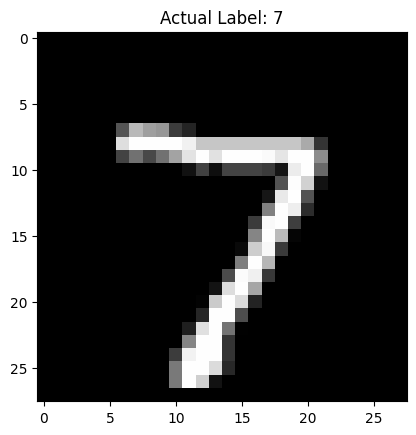

Predicted Label: 7


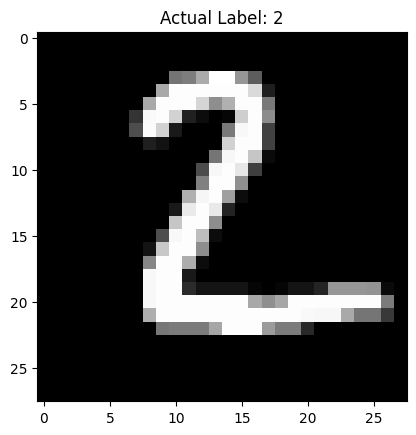

Predicted Label: 2


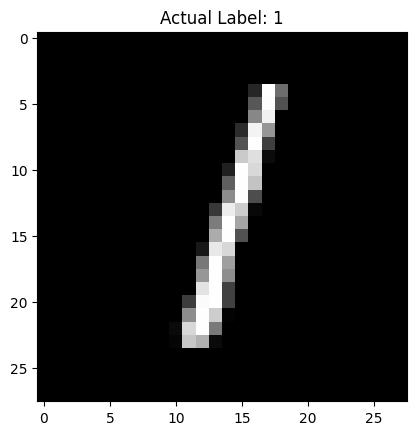

Predicted Label: 1


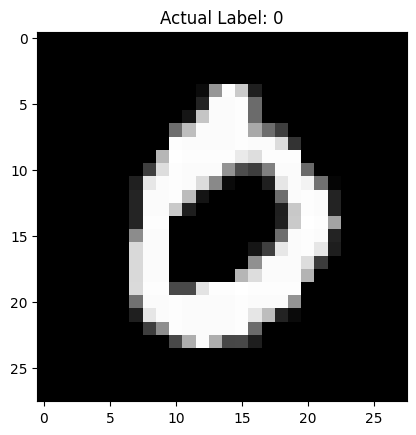

Predicted Label: 0


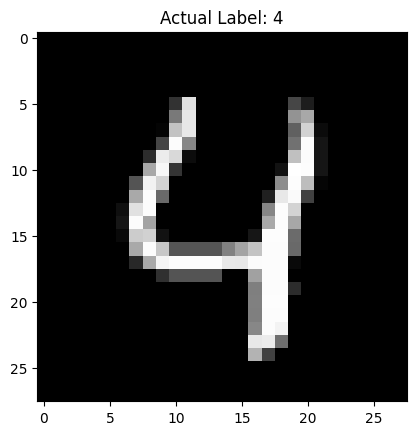

Predicted Label: 4


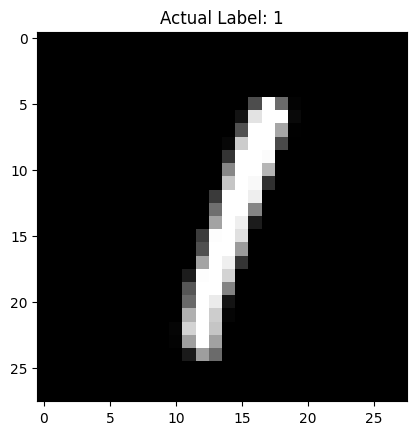

Predicted Label: 1


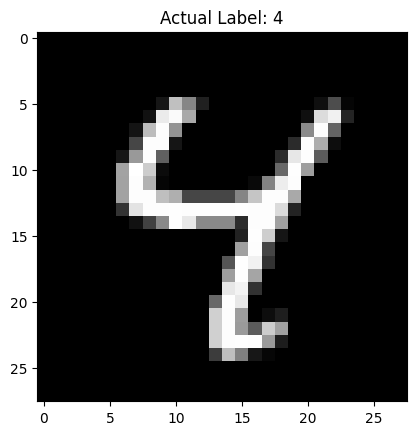

Predicted Label: 4


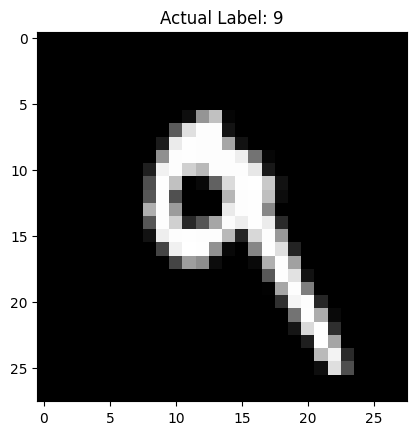

Predicted Label: 9


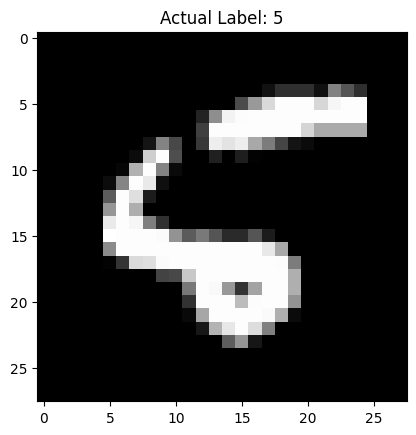

Predicted Label: 5


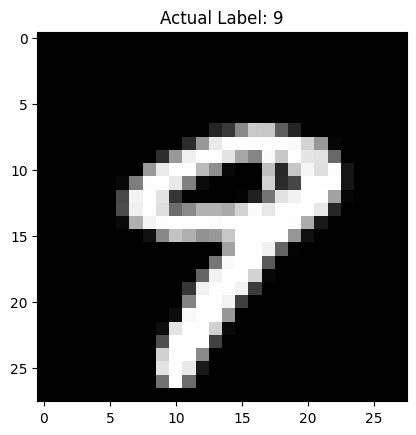

Predicted Label: 9


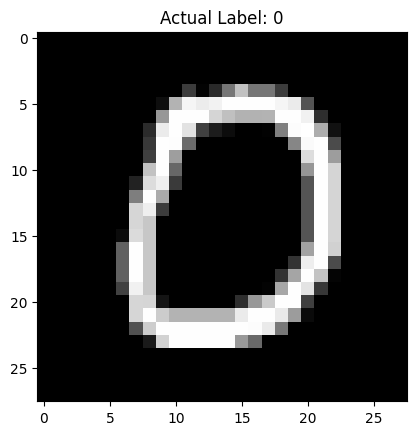

Predicted Label: 0


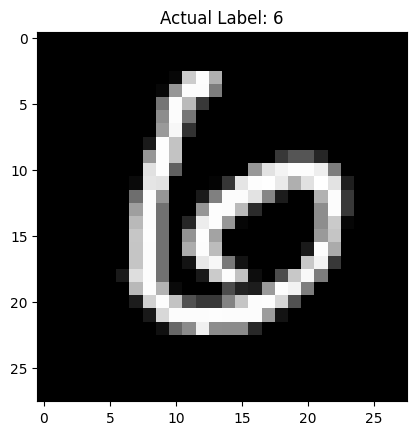

Predicted Label: 6


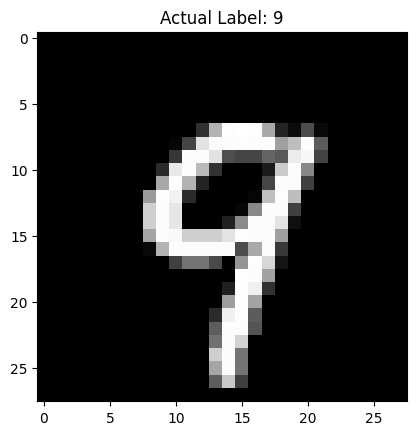

Predicted Label: 9


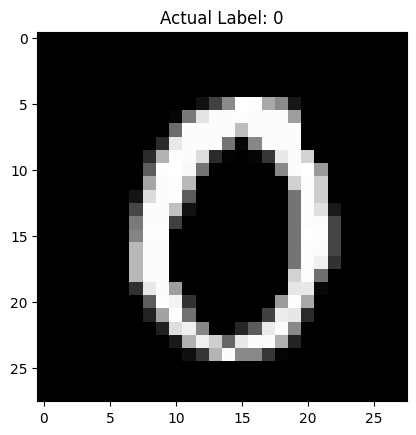

Predicted Label: 0


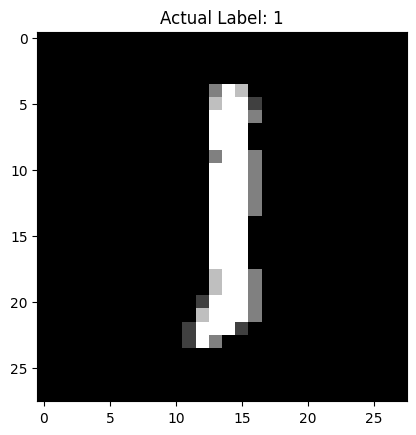

Predicted Label: 1


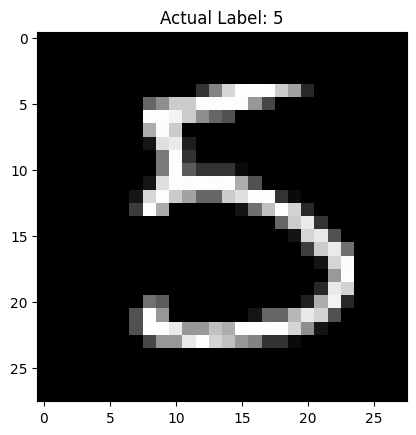

Predicted Label: 5


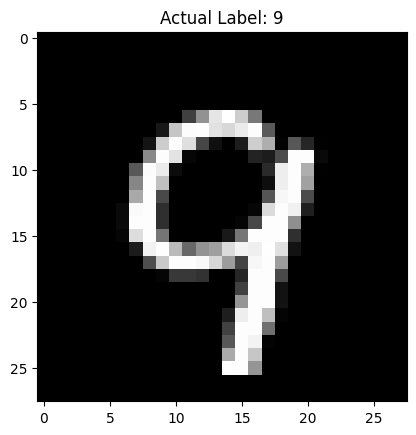

Predicted Label: 9


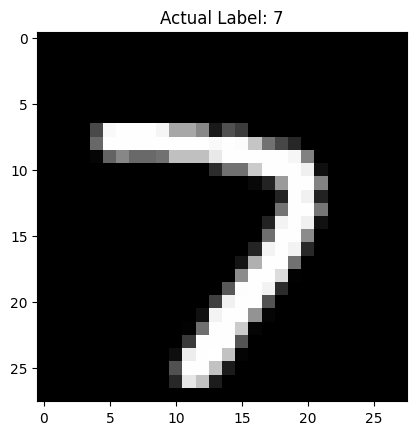

Predicted Label: 7


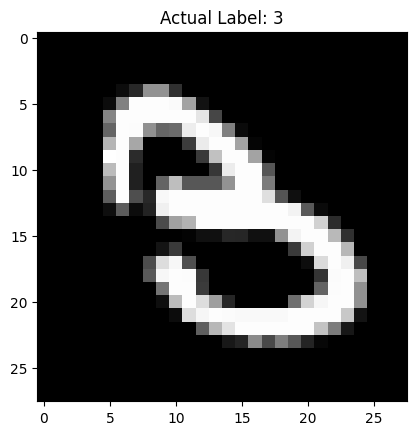

Predicted Label: 3


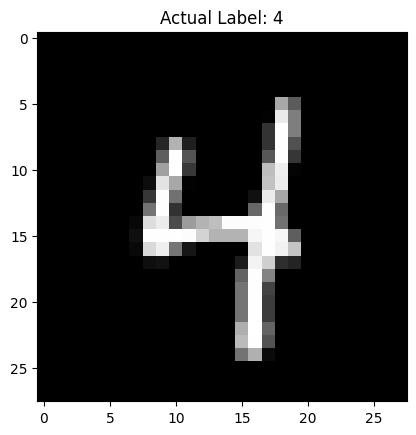

Predicted Label: 4


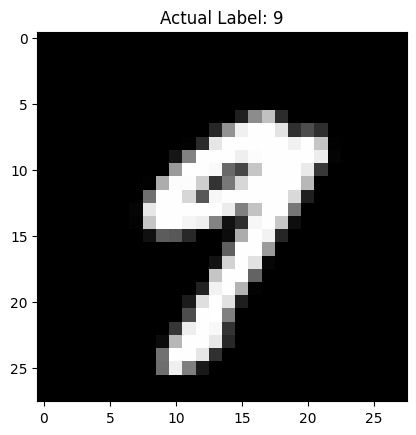

Predicted Label: 9


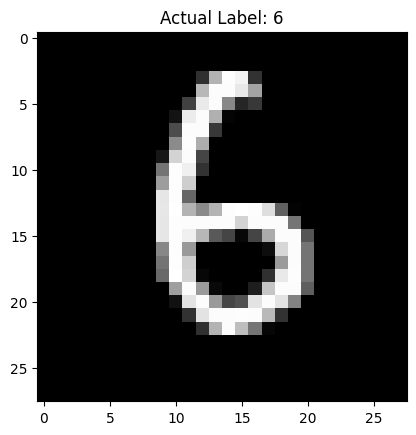

Predicted Label: 6


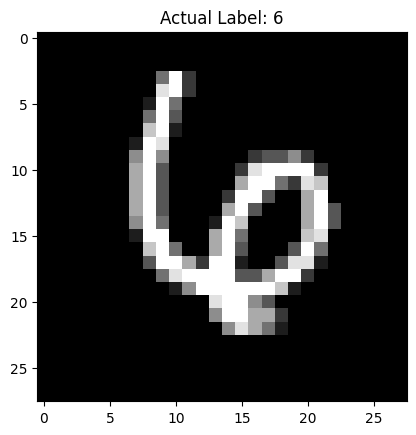

Predicted Label: 6


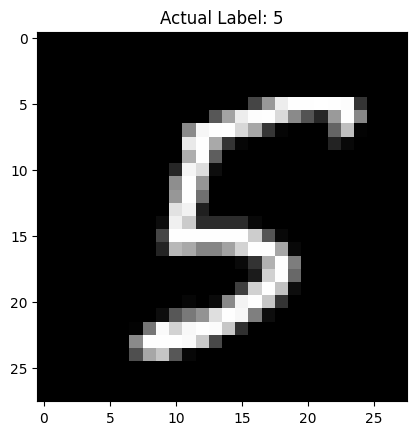

Predicted Label: 5


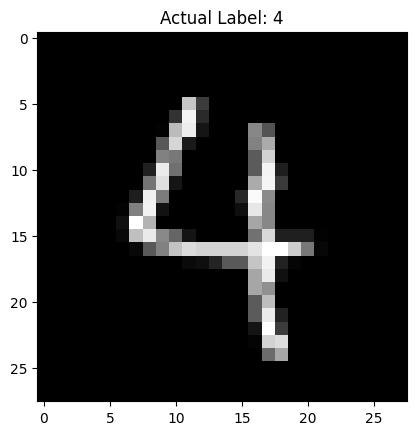

Predicted Label: 4


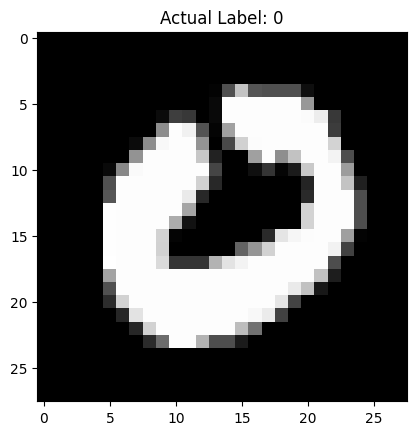

Predicted Label: 0


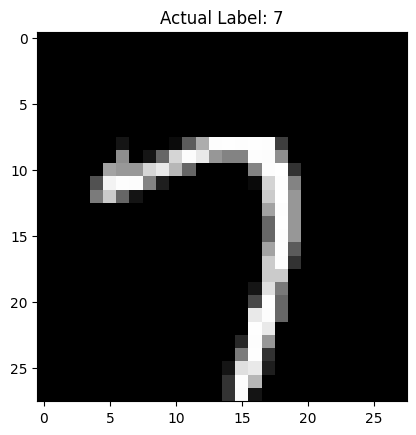

Predicted Label: 7


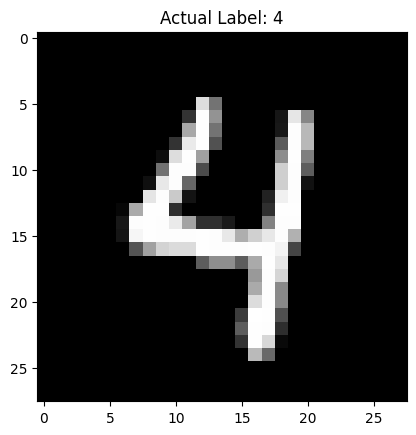

Predicted Label: 4


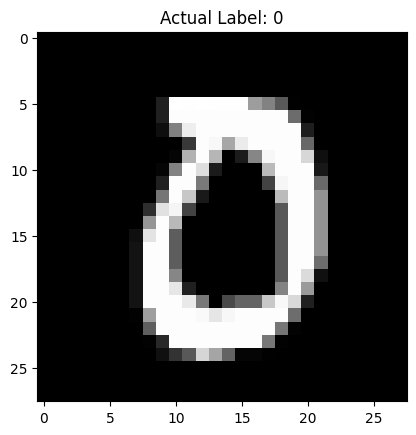

Predicted Label: 0


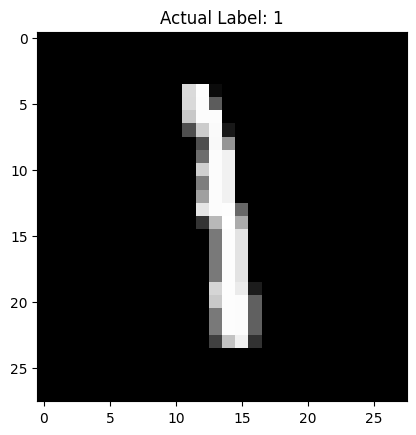

Predicted Label: 1


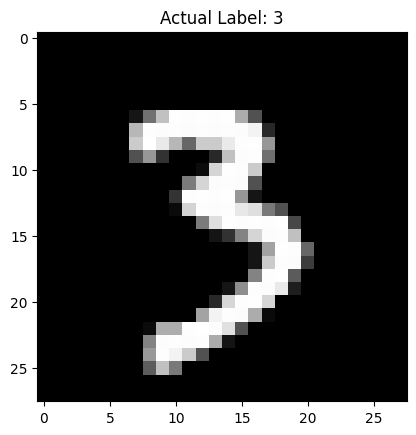

Predicted Label: 3


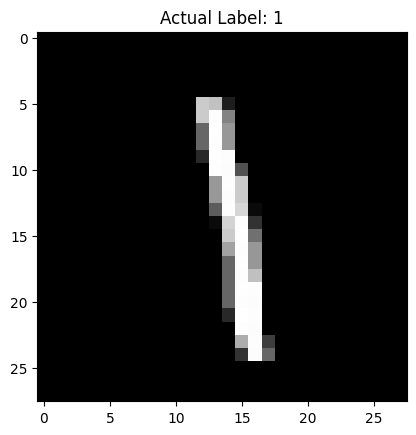

Predicted Label: 1


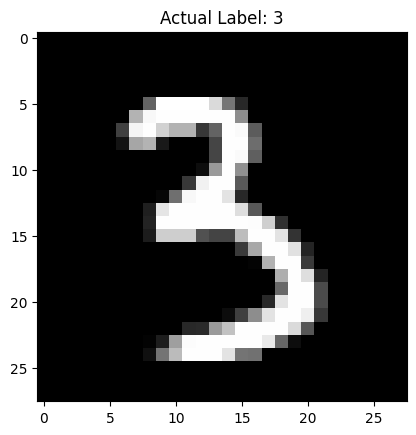

Predicted Label: 3


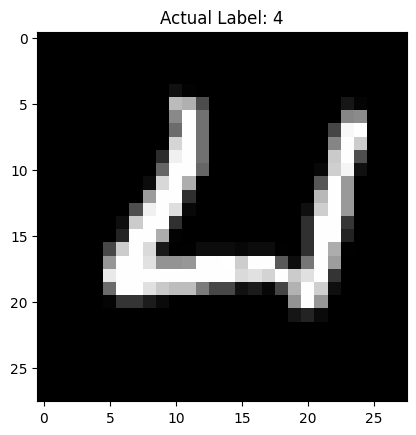

Predicted Label: 4


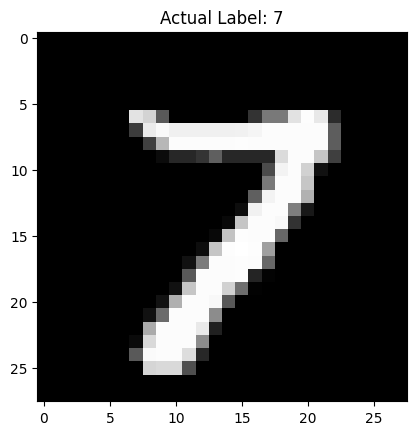

Predicted Label: 7


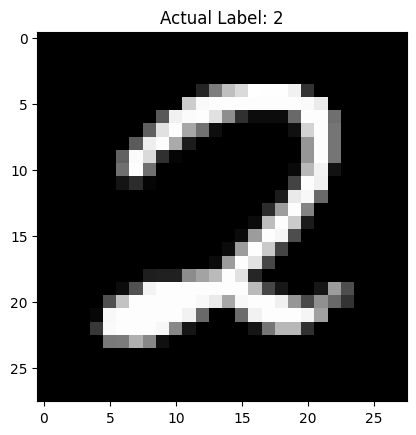

Predicted Label: 2


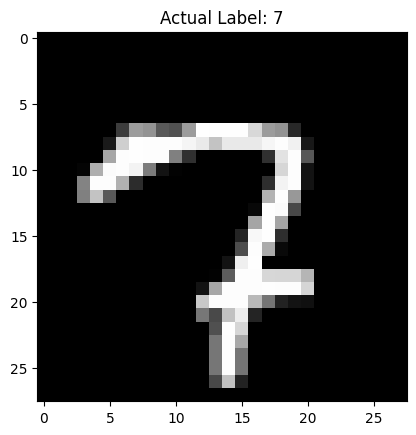

Predicted Label: 7


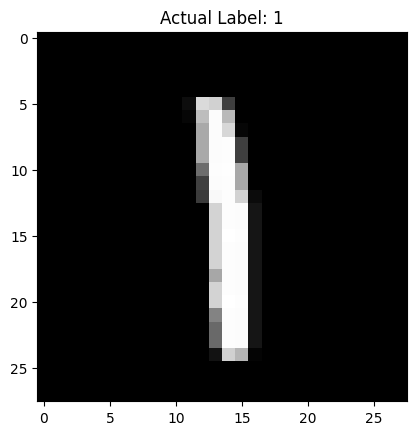

Predicted Label: 1


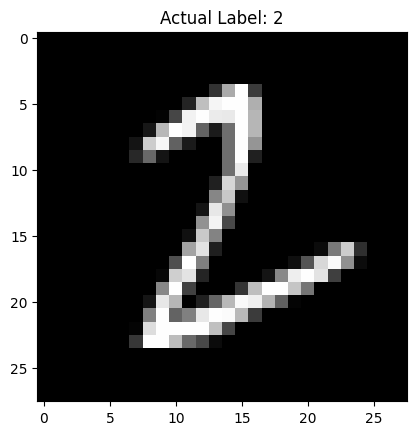

Predicted Label: 2


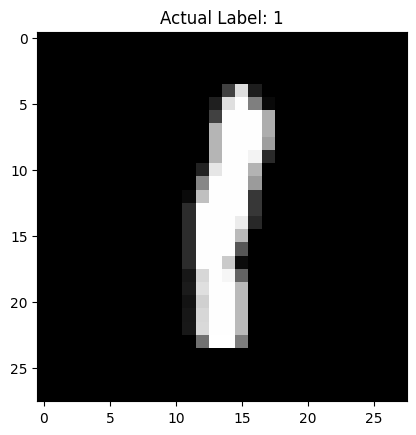

Predicted Label: 1


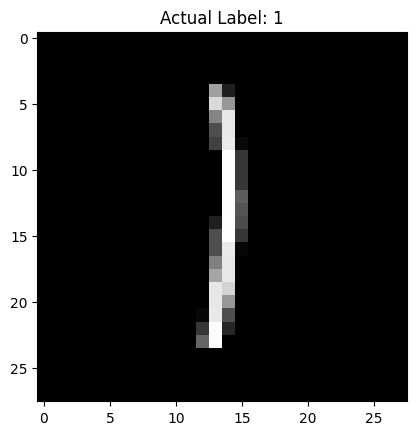

Predicted Label: 1


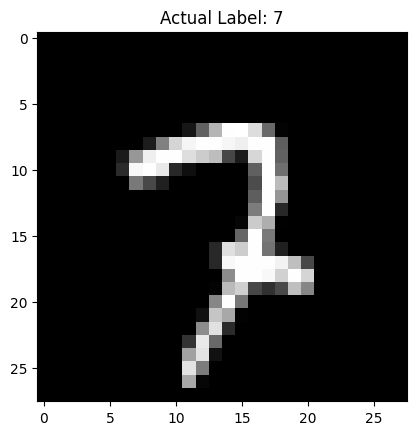

Predicted Label: 7


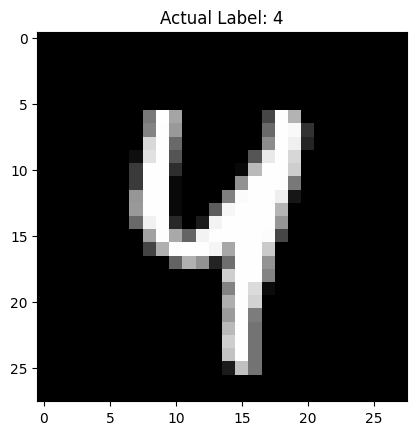

Predicted Label: 4


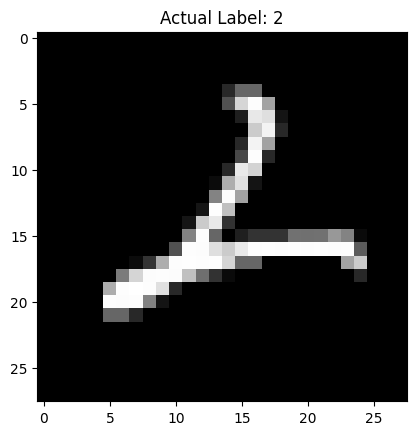

Predicted Label: 2


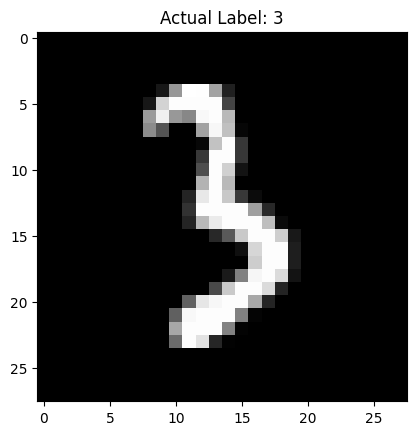

Predicted Label: 3


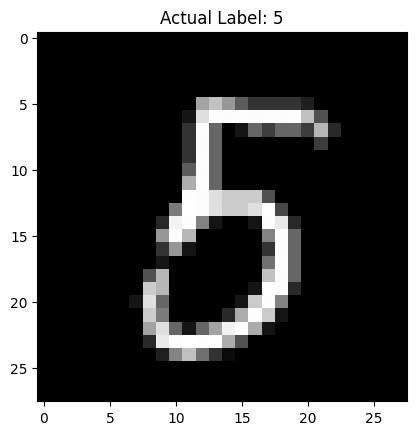

Predicted Label: 5


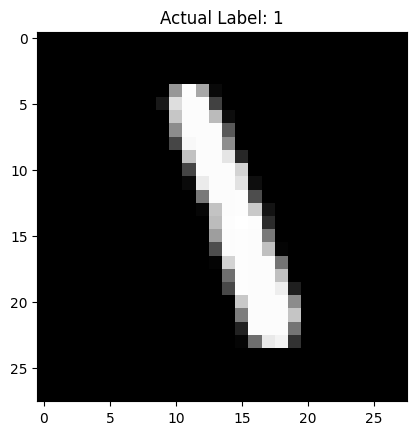

Predicted Label: 1


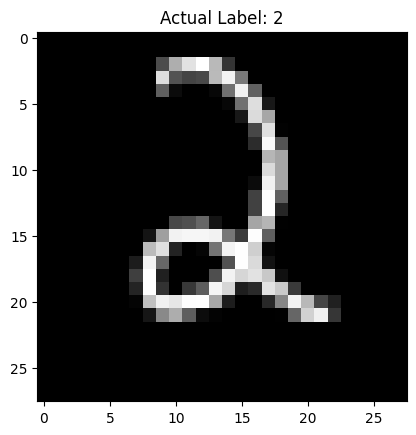

Predicted Label: 2


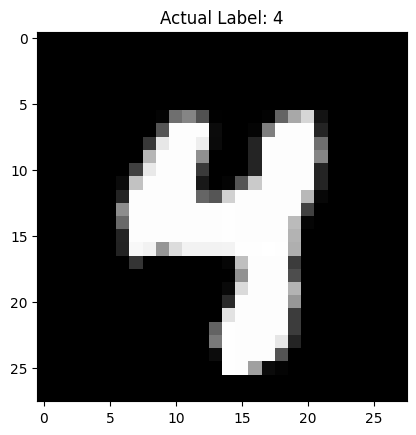

Predicted Label: 4


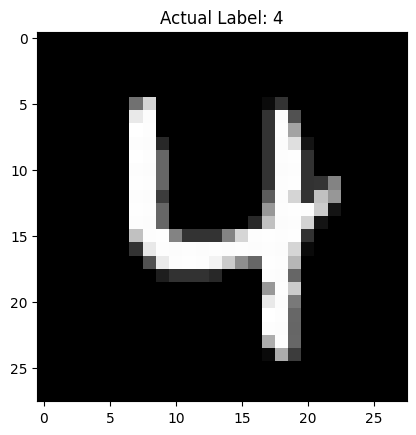

Predicted Label: 4


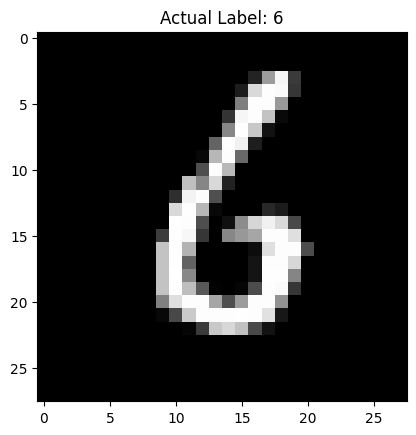

Predicted Label: 6


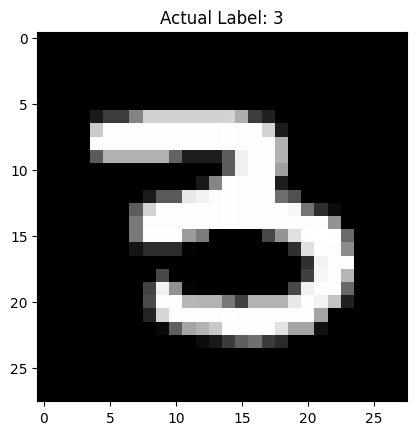

Predicted Label: 3


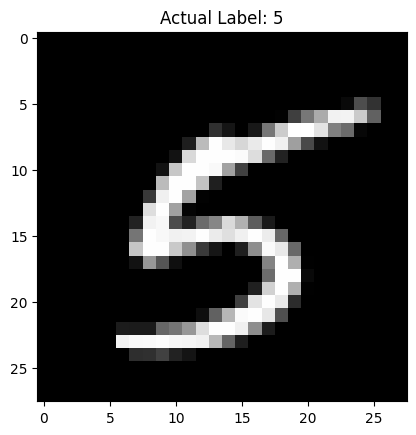

Predicted Label: 5


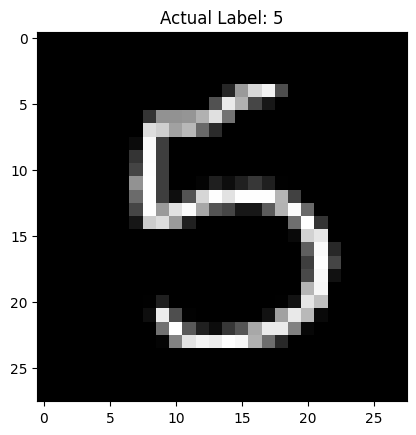

Predicted Label: 5


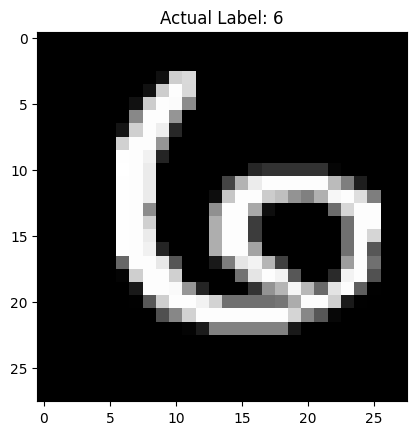

Predicted Label: 6


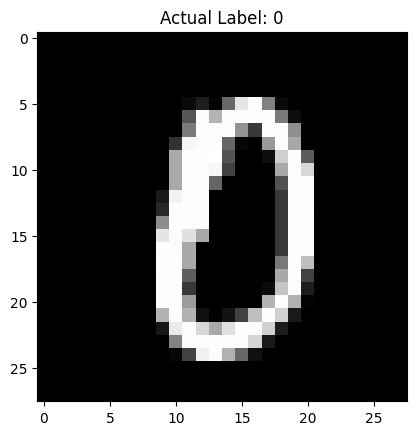

Predicted Label: 0


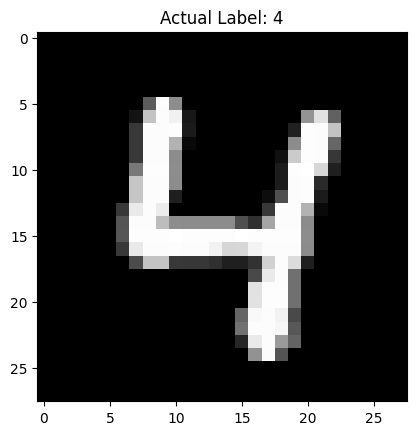

Predicted Label: 4


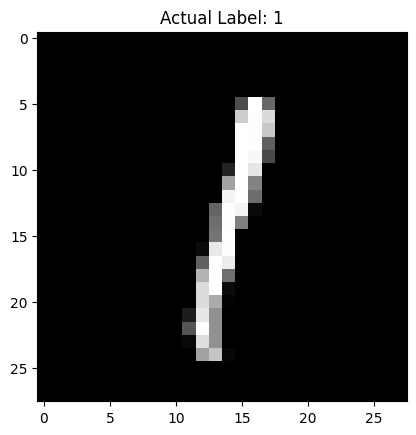

Predicted Label: 1


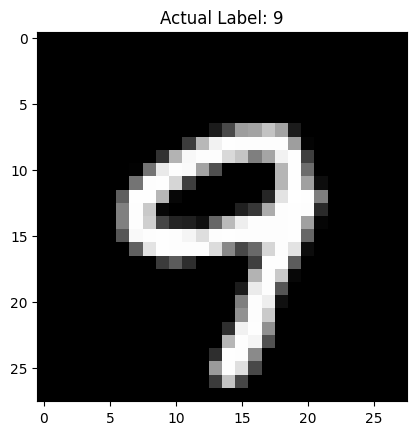

Predicted Label: 9


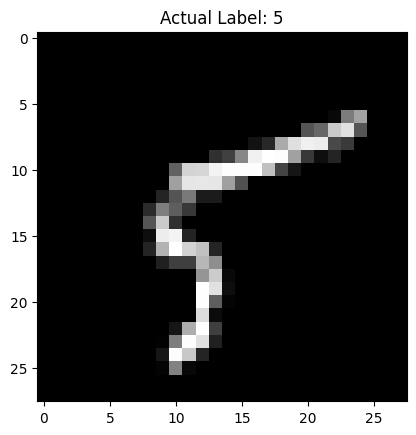

Predicted Label: 5


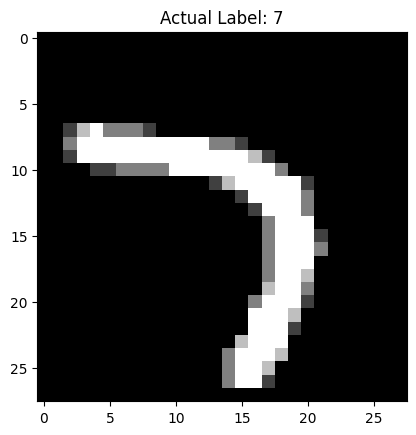

Predicted Label: 7


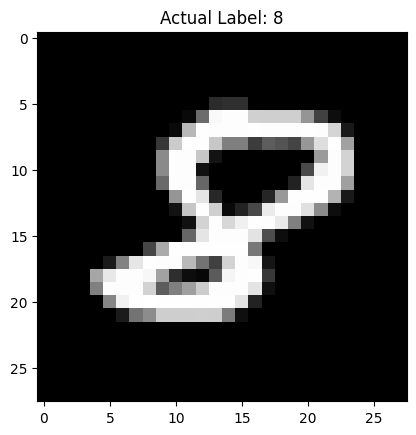

Predicted Label: 8


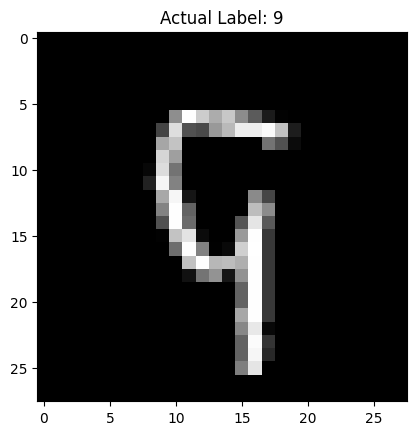

Predicted Label: 9


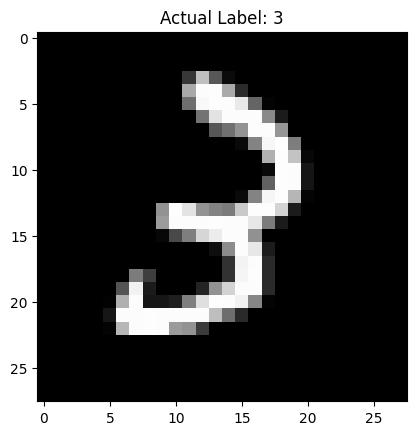

Predicted Label: 3


In [8]:
iterator = iter(test_loader)

# Get the next batch from the iterator
#images, labels = next(iterator)

# Or loop over the first 1 batches: (use for images,labels in iterator: for all of them)
for images,labels in itertools.islice(iterator, 1):

    for image, label in zip(images, labels):
        image_for_pred = image.unsqueeze(0)  # Add a batch dimension
        
        with torch.no_grad():
            output = net(image_for_pred)
            predicted_label = output.argmax(dim=1, keepdim=True)

        # Show false positives by saying 'is not; here
        if predicted_label.item() is label.item():
            plt.imshow(image.squeeze(), cmap='gray')
            plt.title(f'Actual Label: {label}')
            plt.show()
            print(f'Predicted Label: {predicted_label.item()}')

## Other Evaluation Metrics

Neural networks are quite different in how you evaluate them. 

What we saw above was just the accuracy metric. But to truly understand how well they are training, normally we want their losses and accuracies on the training and test sets as we train. 

For example:

![Loss-Acc](./img/loss-acc.png)

Normally, you would plot the losses and accuracies for each epoch, on both the training and test set, to watch if they diverge.

# CIFAR10

Let's move on to a more difficult example. Here we will classify between 10 different classes. The images are also colour. And they should be more difficult to classify. Also we will see more classification metrics.

For this tutorial, we will use the CIFAR10 dataset. It has the classes: 'plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', and 'truck'. The images in CIFAR10 are of size 3x32x32, in other words 3 channel (RGB) images, 32x32 pixels in size.

Here are some examples of the images:

![CIFAR-Examples](./img/cifar10.png)

Let's get the data, which we will get using Torch's `datasets` module, 

In [9]:
import torch
import torchvision
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F

import torchinfo
from tqdm.notebook import tqdm
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# These are transformations applied to every image in the dataset
# They can include image resizing, coverting to greyscale, and so on
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

batch_size = 32

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


One thing that always makes sense is to take a look at the distribution of the data, first with the training set:

In [10]:
unique, counts = np.unique(trainset.targets, return_counts=True)
pd.DataFrame(np.asarray((unique, counts)).T, columns=['class id', 'count'], index=classes)

,class id,count
plane,0,5000
car,1,5000
bird,2,5000
cat,3,5000
deer,4,5000
dog,5,5000
frog,6,5000
horse,7,5000
ship,8,5000
truck,9,5000


And the test set:

In [11]:
unique, counts = np.unique(testset.targets, return_counts=True)
pd.DataFrame(np.asarray((unique, counts)).T, columns=['class id', 'count'], index=classes)

,class id,count
plane,0,1000
car,1,1000
bird,2,1000
cat,3,1000
deer,4,1000
dog,5,1000
frog,6,1000
horse,7,1000
ship,8,1000
truck,9,1000


We can preview some of the images from the dataset and also see their labels:

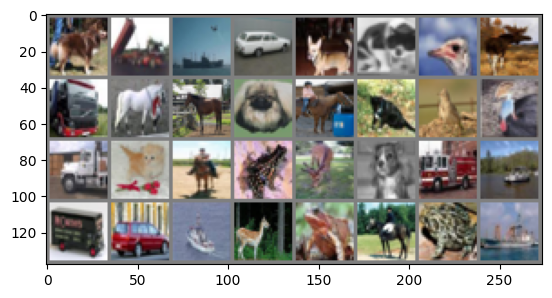

['dog', 'truck', 'ship', 'car', 'dog', 'cat', 'bird', 'deer', 'truck', 'horse', 'horse', 'dog', 'horse', 'cat', 'bird', 'bird', 'truck', 'cat', 'horse', 'frog', 'deer', 'dog', 'truck', 'ship', 'truck', 'car', 'ship', 'deer', 'frog', 'horse', 'frog', 'ship']


In [12]:
# functions to show an image
def imshow(img):
    img = img / 2 + 0.5 # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

# get some random training images
data_iterator = iter(trainloader)
images, labels = next(data_iterator)

# show images
imshow(make_grid(images))

# print labels
labels_t = [f'{classes[labels[x]]}' for x in range(batch_size)]
print(labels_t)

Let's now define a network. 

This is a more complex network that the one above, as we will see when we print its structure and see how many parameters it has.

In [13]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(16 * 5 * 5, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x, 1) # flatten all dimensions except batch
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x

net = Net()

torchinfo.summary(net)

Layer (type:depth-idx)                   Param #
Net                                      --
├─Conv2d: 1-1                            456
├─MaxPool2d: 1-2                         --
├─Conv2d: 1-3                            2,416
├─Linear: 1-4                            48,120
├─Linear: 1-5                            10,164
├─Linear: 1-6                            850
Total params: 62,006
Trainable params: 62,006
Non-trainable params: 0

Again, we define an optimiser and a loss:

In [14]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)

And train over 10 epochs (the data is passed through the network 10 times):

In [15]:
for epoch in range(10):  # loop over the dataset multiple times

    running_loss = 0.0
    
    for i, data in enumerate(tqdm(trainloader), 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        #running_loss += loss.item()
        #if i % 2000 == 1999:    # print every 2000 mini-batches
        #    print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
        #    running_loss = 0.0

print('Finished Training')

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

  0%|          | 0/1563 [00:00<?, ?it/s]

Finished Training


Now that we have finished training, we can test the network on the held out test set! 

First let's look at a batch from the test set, along with their labels:

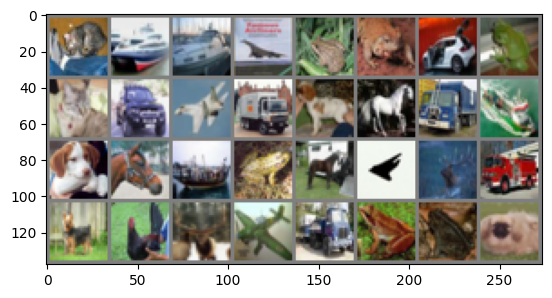

GroundTruth:  cat   ship  ship  plane frog  frog  car   frog  cat   car   plane truck dog   horse truck ship  dog   horse ship  frog  horse plane deer  truck dog   bird  deer  plane truck frog  frog  dog  


In [16]:
data_iterator = iter(testloader)
images, labels = next(data_iterator)

# print images
imshow(make_grid(images))
print('GroundTruth: ', ' '.join(f'{classes[labels[j]]:5s}' for j in range(batch_size)))

And now check out the predictions:

In [17]:
outputs = net(images)
# outputs[0]
# classes[np.argmax(outputs[0])]

_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join(f'{classes[predicted[j]]}'
                              for j in range(batch_size)))

Predicted:  cat car car ship deer frog car frog cat car plane truck dog horse truck ship dog truck ship horse horse plane deer truck deer deer deer deer truck frog cat bird


We can get the accuracy of across all images in the test set:

In [18]:
correct = 0
total = 0

# since we're not training, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in testloader:
        images, labels = data
        # calculate outputs by running images through the network
        outputs = net(images)
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the network on the 10000 test images: {100 * correct // total} %')

Accuracy of the network on the 10000 test images: 61 %


This is much better than random guessing, which would be around 10%. And we trained for about 1 minute, and we were using massively downsized images.

## Evaluating a Neural Network

To properly evaluate the network, we cannot rely on just the average accuracy above, especially when we have 10 classes or more (later we will see a 1000 class classification problem).

Let's see the accuracy by class:

In [19]:
# prepare to count predictions for each class
correct_pred = {classname: 0 for classname in classes}
total_pred = {classname: 0 for classname in classes}

cr_true_labels = []
cr_pred_labels = []

# again no gradients needed
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predictions = torch.max(outputs, 1)
        
        # collect the correct predictions for each class
        for label, prediction in zip(labels, predictions):
            cr_true_labels.append(int(label))
            cr_pred_labels.append(int(prediction))
            if label == prediction:
                correct_pred[classes[label]] += 1
            total_pred[classes[label]] += 1

# print accuracy for each class
for classname, correct_count in correct_pred.items():
    accuracy = 100 * float(correct_count) / total_pred[classname]
    print(f'Accuracy for class {classname:5s} is {accuracy:.1f} %')

Accuracy for class plane is 65.9 %
Accuracy for class car   is 78.0 %
Accuracy for class bird  is 47.2 %
Accuracy for class cat   is 37.6 %
Accuracy for class deer  is 51.5 %
Accuracy for class dog   is 55.8 %
Accuracy for class frog  is 69.6 %
Accuracy for class horse is 68.0 %
Accuracy for class ship  is 76.6 %
Accuracy for class truck is 62.4 %


We can use the `classification_report()` function from SciKit Learn that we used several times yesterday to print a report. This works even though we did not use SciKit Learn to train the model at all (as it just requires lists of predictions and labels):

In [20]:
from sklearn.metrics import classification_report
print(classification_report(cr_true_labels, cr_pred_labels))

              precision    recall  f1-score   support

           0       0.61      0.66      0.63      1000
           1       0.70      0.78      0.74      1000
           2       0.53      0.47      0.50      1000
           3       0.48      0.38      0.42      1000
           4       0.56      0.52      0.54      1000
           5       0.51      0.56      0.53      1000
           6       0.68      0.70      0.69      1000
           7       0.66      0.68      0.67      1000
           8       0.67      0.77      0.71      1000
           9       0.69      0.62      0.66      1000

    accuracy                           0.61     10000
   macro avg       0.61      0.61      0.61     10000
weighted avg       0.61      0.61      0.61     10000



And we can also plot a confusion matrix:

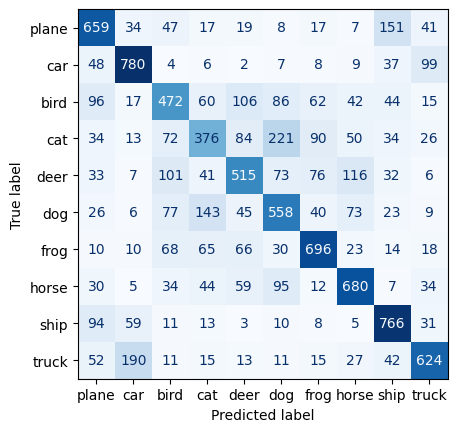

In [21]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(cr_true_labels, cr_pred_labels)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
disp.plot(cmap='Blues', colorbar=False);

Here you see the confusion across classes of the model's predictions. 

For example, you can quickly see tha cat has a lot of confusion. It is often confused with dog. 

## Saving a Model

Once you have trained a model, you can saved it to be used later. 

In essence what you are really doing is saving the model's weights. That means that the larger the network, the bigger the saved model. 

In the case of a network where each weight is some 32-bit precision number (float32), as is the generally the default, then 4 bytes are required per weight. 

So, for a model with 6 million parameters, we have 4 x 6 million bytes = 24 million bytes, which is 24MB. 

You can also see how large some of the large language models are. For example Llama from Facebook has 65 billion parameters, this is 260GB of weights for the model. Often, however, you will see 16 bit floats or even less precision, and the files sizes can be smaller, at 1 byte per parameter, which still results in 65GB file size and 65GB of GPU memory required to run the file.

Luckily, our trained model is much smaller:

In [22]:
torchinfo.summary(net, (batch_size, 3, 32, 32))

Layer (type:depth-idx)                   Output Shape              Param #
Net                                      [32, 10]                  --
├─Conv2d: 1-1                            [32, 6, 28, 28]           456
├─MaxPool2d: 1-2                         [32, 6, 14, 14]           --
├─Conv2d: 1-3                            [32, 16, 10, 10]          2,416
├─MaxPool2d: 1-4                         [32, 16, 5, 5]            --
├─Linear: 1-5                            [32, 120]                 48,120
├─Linear: 1-6                            [32, 84]                  10,164
├─Linear: 1-7                            [32, 10]                  850
Total params: 62,006
Trainable params: 62,006
Non-trainable params: 0
Total mult-adds (M): 21.06
Input size (MB): 0.39
Forward/backward pass size (MB): 1.67
Params size (MB): 0.25
Estimated Total Size (MB): 2.31

We have 62,006 parameters, which makes 248,024 bytes, which is only 0.25MB. As you can see there is some overhead, so the entire model is about 2.31 MB. 

To save the model, we do the following:

In [23]:
torch.save(net.state_dict(), './data/cifar10-model.pt')

We can have a look at the size of the file:

In [24]:
! ls -lAhF ./data/cifar10-model.pt

-rw-rw-r-- 1 mblo mblo 246K Mar  8 00:57 ./data/cifar10-model.pt


A very small model in fact! 

To load a model, it is a matter of a few lines of code also:

```python
model = TheModelClass(*args, **kwargs)
model.load_state_dict(torch.load(PATH))
model.eval()
```

We will load a pre=trained model in an example later.

---

# PyTorch Hub

PyTorch Hub lets you download pre-trained models very easily.

What is a pretrained model? This is a model that has been trained already, perhaps on millions of images, and where the weights have been made available. 

Using a pre-trained model saves you the effort of training a model for a long time with data you don't have. 

These pre-trained models can be used as is, or can be fine-tuned to suit your specific task. We will discuss fine-tuning later.

Here we download ResNet18 and ask that we retrieve the pre-trained weights also. Note that is has been trained on ImagetNet, a 1,000 class classification problem. We will look at the classes soon.

Download the model as follows:

In [25]:
import torchvision
import torch

# Get a ResNet18 pretrained model
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True)

# Important to set the model to evaluation mode before trying to get predictions. 
model.eval()

Using cache found in /home/mblo/.cache/torch/hub/pytorch_vision_v0.10.0
/home/mblo/.pyenv/versions/python-course/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/mblo/.pyenv/versions/python-course/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Once downloaded and loaded, it will print this information.

Let's make it predict an image:

First, we download an example image:

In [26]:
# Download an example image from the pytorch website
import urllib
url, filename = ("https://github.com/pytorch/hub/raw/master/images/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

Then we convert this image in to a format we can view, and preview it here in the notebook:

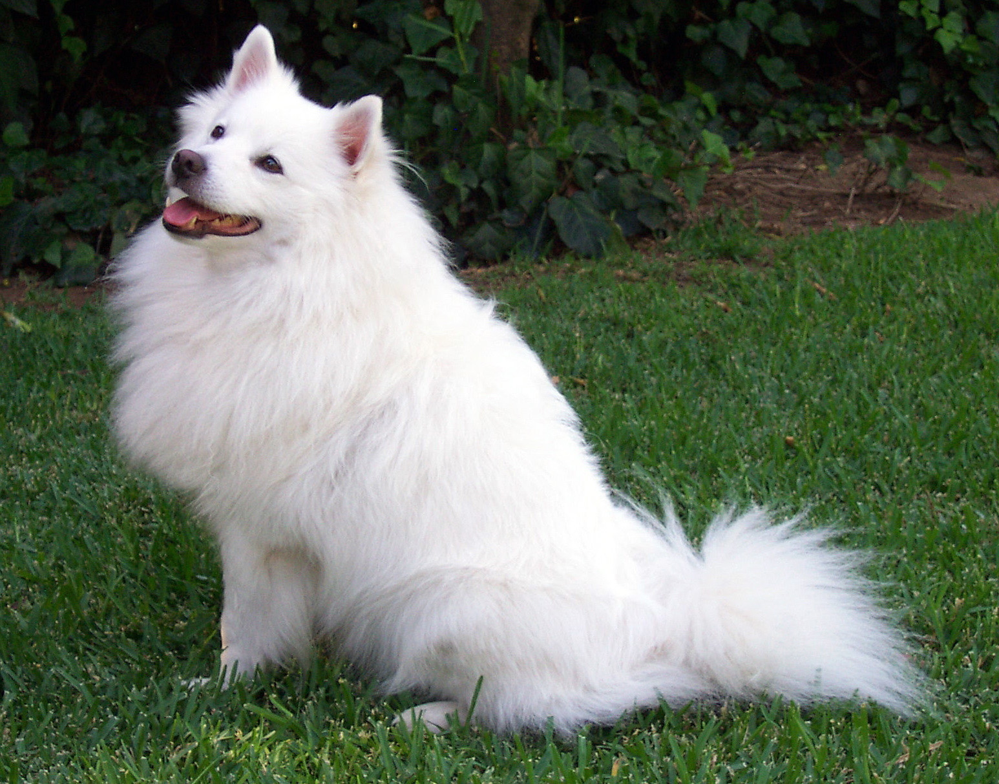

In [27]:
from PIL import Image
input_image = Image.open(filename)
input_image

Now we can ask the network to make its predictions based on the dog image above:

In [28]:
from torchvision import transforms

preprocess = transforms.Compose([
    transforms.Resize(224),
    #transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model

# move the input and model to GPU for speed if available
#if torch.cuda.is_available():
#    input_batch = input_batch.to('cuda')
#    model.to('cuda')

with torch.no_grad():
    output = model(input_batch)
    
# Tensor of shape 1000, with confidence scores over ImageNet's 1000 classes
# print(output[0])
# The output has unnormalized scores. To get probabilities, you can run a softmax on it.
probabilities = torch.nn.functional.softmax(output[0], dim=0)
print(probabilities)

tensor([2.0253e-06, 4.6015e-07, 2.1712e-06, 3.7484e-07, 6.0027e-07, 1.4836e-05,
        8.0225e-06, 9.0132e-05, 4.7547e-04, 1.4974e-05, 5.0252e-08, 4.1929e-07,
        2.6192e-07, 8.5847e-08, 5.4361e-07, 8.1347e-08, 9.9876e-07, 1.8350e-05,
        2.3450e-06, 2.2935e-06, 1.0579e-07, 2.5340e-06, 3.2334e-07, 3.1561e-06,
        9.9037e-07, 5.3552e-07, 7.5353e-08, 3.0860e-07, 4.7903e-07, 3.8693e-06,
        3.8321e-07, 8.8546e-07, 1.9710e-07, 2.7584e-07, 1.0973e-06, 1.1237e-07,
        4.6308e-07, 1.7280e-07, 1.5384e-07, 1.9388e-07, 4.8137e-07, 8.3850e-08,
        4.6578e-08, 4.8148e-08, 7.1930e-07, 8.6464e-07, 8.6086e-07, 2.7903e-07,
        3.1272e-07, 1.9220e-06, 2.4195e-06, 2.0205e-06, 5.7111e-07, 3.6809e-07,
        6.4715e-07, 1.8170e-07, 1.8784e-06, 1.7957e-07, 3.6145e-07, 4.5783e-07,
        1.1116e-06, 4.4988e-07, 3.7918e-07, 1.5690e-07, 3.8711e-07, 5.8425e-07,
        1.1353e-06, 6.4822e-07, 7.7692e-07, 5.4280e-08, 2.3703e-07, 7.0037e-07,
        2.6783e-07, 1.8665e-07, 2.3154e-

As you can see, the raw output is a list of 1,000 probabilities. Each probability is a confidence score of the how likely the network thinks the image belongs to that class.

These probabilities sum to 1, as we can see:

In [29]:
probabilities.sum()

tensor(1.0000)

Let's take the top 5 probabilities which would be the top 5 predictions of which class this image belongs to:

In [30]:
# Read the categories
with open("./data/imagenet_classes.txt", "r") as f:
    categories = [s.strip() for s in f.readlines()]

# Show top categories per image
top5_prob, top5_catid = torch.topk(probabilities, 5)
for i in range(top5_prob.size(0)):
    print(categories[top5_catid[i]], top5_prob[i].item())

Samoyed 0.7087838649749756
white wolf 0.13009659945964813
keeshond 0.04462965577840805
Arctic fox 0.029686754569411278
Pomeranian 0.026079289615154266


Looks like the network was right, even recognising the difference between a samoyed and a white wolf.

---

# Medical Image Analysis

In the following paper by Beck, et al. we see the following:

![Patho](./img/patho-workflow.png)

*Source*: Beck, A.H., Sangoi, A.R., Leung, S., Marinelli, R.J., Nielsen, T.O., Van De Vijver, M.J., West, R.B., Van De Rijn, M. and Koller, D. Systematic analysis of breast cancer morphology uncovers stromal features associated with survival. Science Translational Medicine, 3(108), 2011. <https://www.science.org/doi/10.1126/scitranslmed.3002564>

What is interesting about this workflow is the amount of effort and expertise required to perform this task.

Nowadays you could prob skip the vast majority of that work, and simply train a network to do this from end to end, without wortying about any of these intermediate steps. It would require none of the preprocessing and expertise and domain knowledge that was required to do the work int the paper above.

We can illustrate this now by training a network to predict skin lesions types.

# MedMNIST

We have seen MNIST, let's take a look at MedMNIST.

MedMNIST is a collection of pre-processed medical image datasets, designed specifically for benchmarking machine learning models in the context of healthcare. To demonstrate its use, we will walk you through the process of loading some of its datasets and previewing the data using Python.

Let's make a number of imports and define a function to view the images easily, as we will do this several times:

In [31]:
import medmnist
from medmnist import Evaluator
import numpy as np
import matplotlib.pyplot as plt
import random

# Let's also define a function to visualise images easily later
def visualise_medmnist(data, num_images=6):
    plt.figure(figsize=(12, 8))

    for i in range(num_images):
        plt.subplot(2, 3, i + 1)
        idx = random.randint(0, len(data) - 1)
        image, label = data[idx]
        # image = image.squeeze()  # Remove channel dimension if it exists
        plt.imshow(image, cmap='gray')
        plt.title(f'Label: {label}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

There are several datasets included in MedMNIST (see <https://medmnist.com>), covering a wide arary of medical image types:

![MedMNIST](./img/MedMNIST.png)

*Source*: Yang J, Shi R, Wei D, Liu Z, Zhao L, Ke B, Pfister H, Ni B. MedMNIST v2-A large-scale lightweight benchmark for 2D and 3D biomedical image classification. Nature Scientific Data. 2023 Jan 19;10(1):41.

The data included in MedMNIST covers several types of medical imagery, from dermatology, to histopathology as well as 3D datasets such as the OrganMNIST3D abdominal CT dataset. 

Let's have a look at the Dermatology dataset.

The data can be downloaded in various file sizes, which you can specify with the `size=128` parameter:

In [32]:
from medmnist import DermaMNIST

derma_dataset = DermaMNIST(split="train", download=True, size=128)  # Can be up to 256

Using downloaded and verified file: /home/mblo/.medmnist/dermamnist_128.npz


The documentation for MedMNIST is actaully not very good on the official website, however it is well documented within the package itself. 

Therefore, we can use `?` at any time, as we have seen several times:

In [33]:
DermaMNIST?

Init signature:
DermaMNIST(
    split,
    transform=None,
    target_transform=None,
    download=False,
    as_rgb=False,
    root='/home/mblo/.medmnist',
    size=None,
    mmap_mode=None,
)
Docstring:     
An abstract class representing a :class:`Dataset`.

All datasets that represent a map from keys to data samples should subclass
it. All subclasses should overwrite :meth:`__getitem__`, supporting fetching a
data sample for a given key. Subclasses could also optionally overwrite
:meth:`__len__`, which is expected to return the size of the dataset by many
:class:`~torch.utils.data.Sampler` implementations and the default options
of :class:`~torch.utils.data.DataLoader`. Subclasses could also
optionally implement :meth:`__getitems__`, for speedup batched samples
loading. This method accepts list of indices of samples of batch and returns
list of samples.

.. note::
  :class:`~torch.utils.data.DataLoader` by default constructs a index
  sampler that yields integral indices.  To make 

---

Let's preview the data:

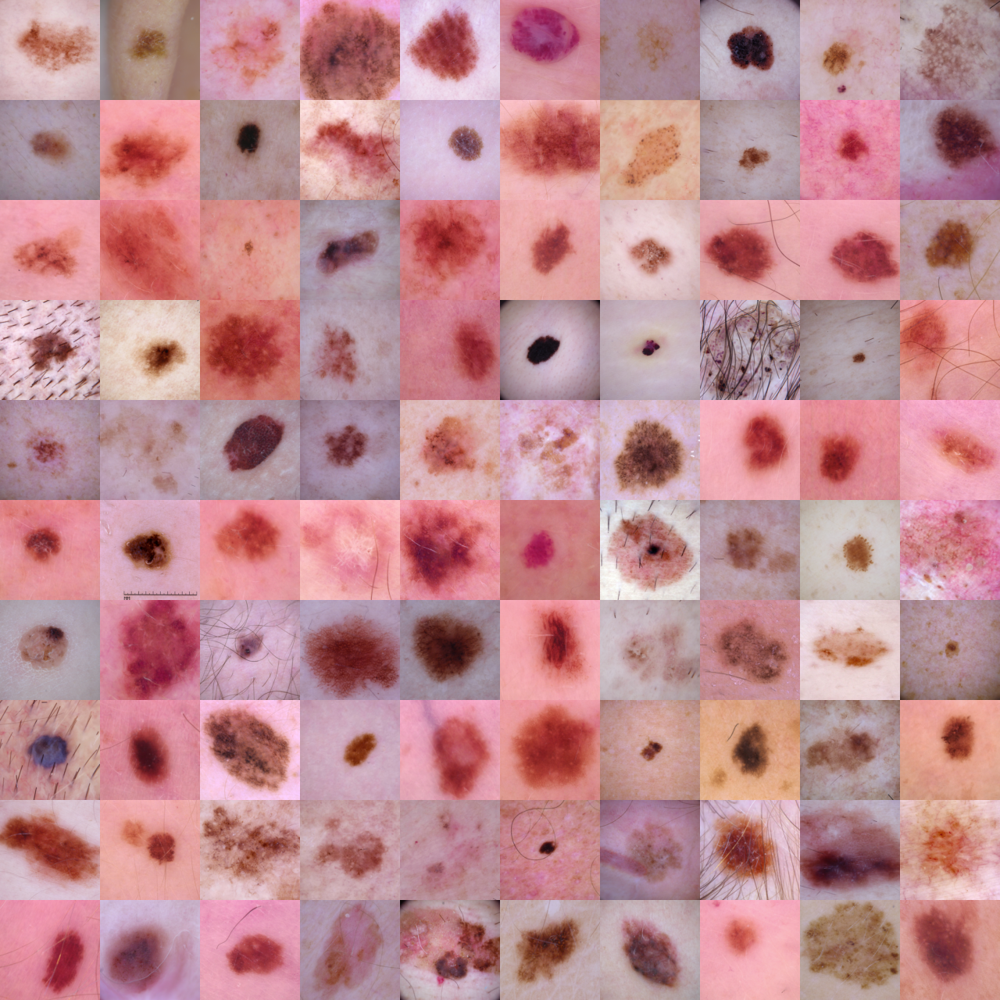

In [34]:
derma_dataset.montage(10)

Using the `visualise_medmnist` function we defined above, we can preview this data. The function prints a random 6 images from the dataset. Each time we call the function we will get another random 6 images.

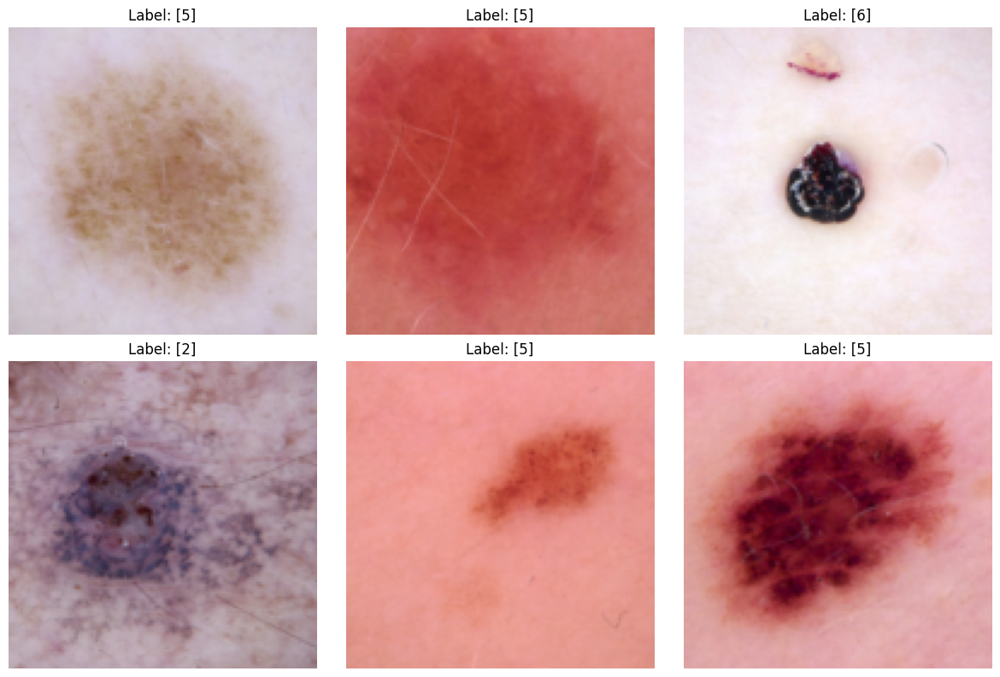

In [35]:
visualise_medmnist(derma_dataset)

First thing to notice is that we are dealing with a dataset of skin lesions that were collected using a **dermatoscope**.

A dermatoscope is similar to a camera, and provides a non-invasive method to analyse skin lesions:

![Dermatoscope](./img/dermatoscope.jpeg)

*Source*: <https://commons.wikimedia.org/w/index.php?curid=2431174> 

The camera can fully enclose the lesion and therefore is unaffected by ambient light, and has its own powerful light that illuminates the lesion in a way that enhances the visibility of surface patterns and colours not seen by the naked eye. Dermatoscopes have a magnifier, typically around 10x. 

This close-up view provides detailed information about the morphology, skin lesions, melanomas and other types of skin cancer, moles and so on.

Let's take a look at what `derma_dataset` contains:

In [36]:
derma_dataset

Dataset DermaMNIST of size 128 (dermamnist_128)
    Number of datapoints: 7007
    Root location: /home/mblo/.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'actinic keratoses and intraepithelial carcinoma', '1': 'basal cell carcinoma', '2': 'benign keratosis-like lesions', '3': 'dermatofibroma', '4': 'melanoma', '5': 'melanocytic nevi', '6': 'vascular lesions'}
    Number of samples: {'train': 7007, 'val': 1003, 'test': 2005}
    Description: The DermaMNIST is based on the HAM10000, a large collection of multi-source dermatoscopic images of common pigmented skin lesions. The dataset consists of 10,015 dermatoscopic images categorized as 7 different diseases, formulized as a multi-class classification task. We split the images into training, validation and test set with a ratio of 7:1:2. The source images of 3×600×450 are resized into 3×28×28.
    License: CC BY-NC 4.0

By reading the text, we can see, we have 10,015 images in total. They are already split in to a train, validation, and test sets as this is a benchmarking dataset (therefore various groups might want to compare their results using the exact same test set).

So the dataset has a total of 10,015 images and they are split up as follows:

| Split      | Number     |
|------------|------------|
| Train      | 7,007      |
| Validation | 1,003      |
| Test       | 2,005      |
| **Total**  | **10,015** |

The images are in colour, as indicated by the `Number of channels: 3` for the three channels of RGB.

Last, the images are of 7 distinct diseases, and is therefore a multi-class classification problem.

The 7 diseases are shown in the `Meaning of labels` field and are as follows: 

0. actinic keratoses and intraepithelial carcinoma
1. basal cell carcinoma
2. benign keratosis-like lesions
3. dermatofibroma
4. melanoma
5. melanocytic nevi
6. vascular lesions

Maybe it would be interesting to see how each of the 7 different classes look. For example, are the melanoma vastly different in appearance to nevi? 

Note here that melanocytic nevi or nevi are benign lesions normally called moles, while melanoma are cancerous, malignant lesions that are harmful and can spread (metastasise). 

We can also take a look at how each class looks.

We can use `np.where()` to search for subsets of data by their labels:

In [37]:
labels = ['keratoses', 'basal', 'benign keratosis', 'dermatofibroma', 'melanoma', 'nevi', 'vascular']

keratoses_idx = np.where(derma_dataset.labels==0)[0]
basal_idx = np.where(derma_dataset.labels==1)[0]
benign_keratoses_idx = np.where(derma_dataset.labels==2)[0]
dermatofibroma_idx = np.where(derma_dataset.labels==3)[0]
melanoma_idx = np.where(derma_dataset.labels==4)[0]
nevi_idx = np.where(derma_dataset.labels==5)[0]
vascular_idx = np.where(derma_dataset.labels==6)[0]

Now we can preview each class to see if something interesting is going on:

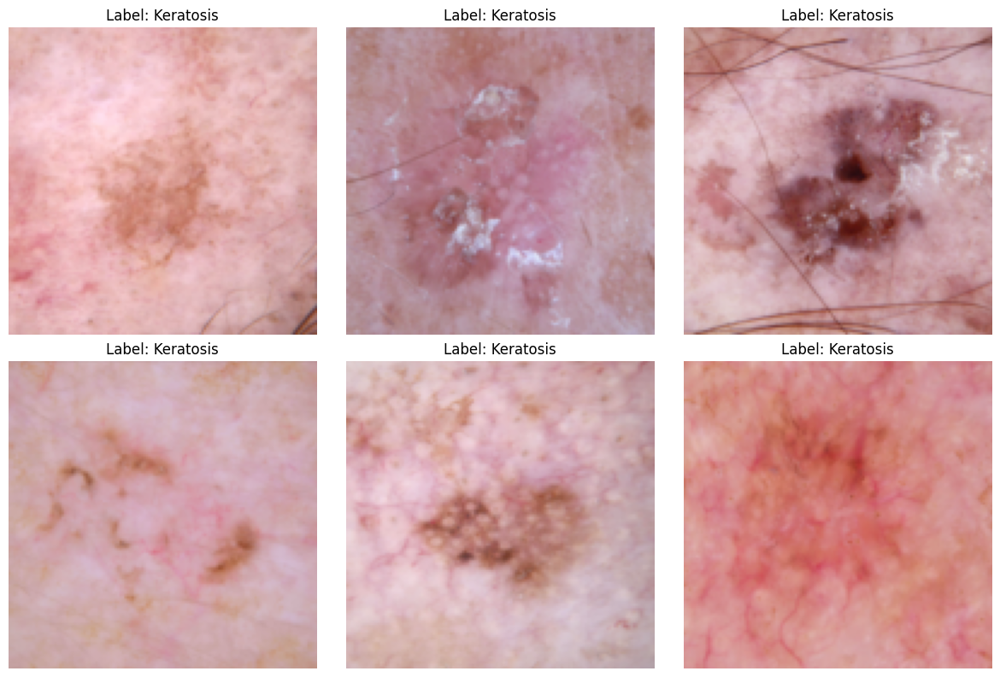

In [38]:
visualise_medmnist([(derma_dataset.imgs[i], "Keratosis") for i in keratoses_idx])

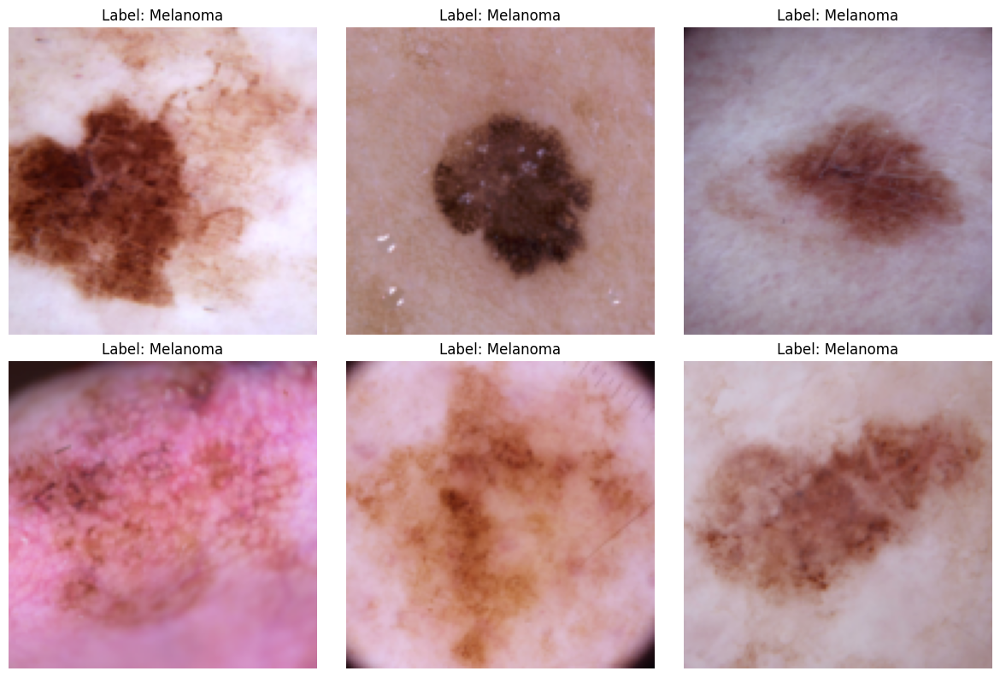

In [39]:
visualise_medmnist([(derma_dataset.imgs[i], "Melanoma") for i in melanoma_idx])

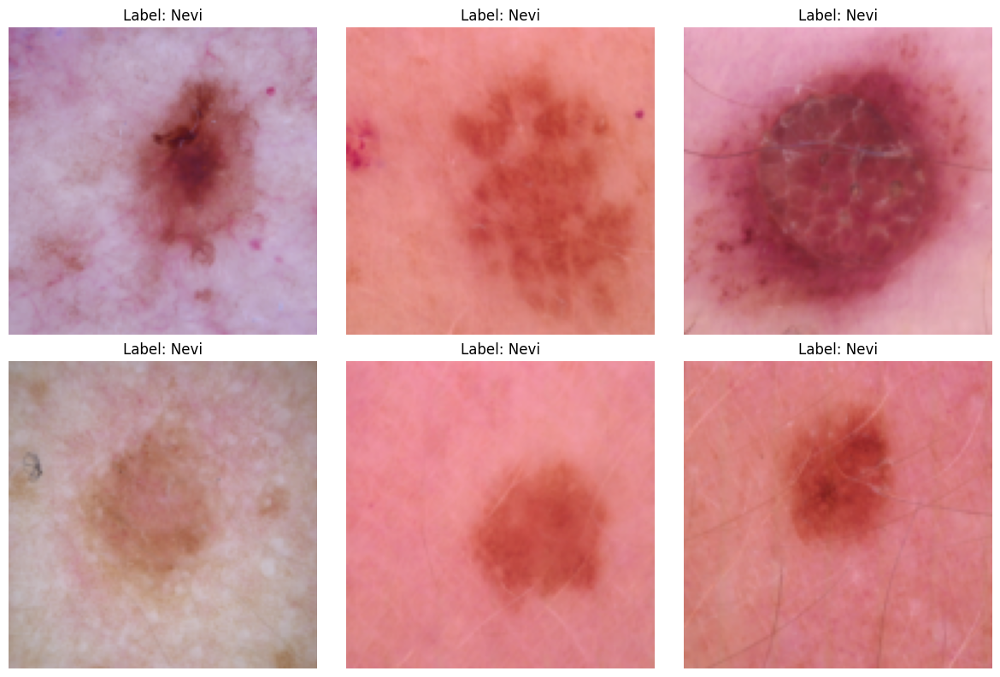

In [40]:
visualise_medmnist([(derma_dataset.imgs[i], "Nevi") for i in nevi_idx])

## ABCDE

If we think back to how we might tackle the problem of classifying or diagnosing skin lesions based on features, it might make sense to understand how a dermatologist or doctor might make such a diagnosis. 

Upon visual examination by dermatologist, the following characteristics are normally noted (ABCDE test):

- A: Asymmetry - melanoma often present as asymetrical and non-uniform, non-round. 
- B: Border - melanoma have less well-defined borders than non-cancerous moles. They appear to smudge between skin tissue and the lesion itself.
- C: Colour - melanoma are darker in appearance (melanoma start in the melanocytes, and these are the cells that give your skin its pigment) and have multiple shades of colours, while non-cancerous moles tend to have one colour
- D: Diameter - melanoma are larger and will grow larger than 5 or 6mm. 
- E: Evolution - melanoma tend to change shape, size, and colour oven time, or nayb begin to itch or bleed, unlike benign moles.

See: <https://www.mayoclinic.org/diseases-conditions/melanoma/symptoms-causes/syc-20374884>

## Closer Look at the Data

Let's take a closer look at the data and determine how to train a network with it.

For example, we can take a look at the distribution of the various classes.

In [41]:
import pandas as pd

# Get the unique values and their counts/frequencies
unique, counts = np.unique(derma_dataset.labels, return_counts=True)

# Print nicely using a DataFrame
pd.DataFrame(np.asarray((unique, counts)).T, columns=['class id', 'freq.'], index=labels)

,class id,freq.
keratoses,0,228
basal,1,359
benign keratosis,2,769
dermatofibroma,3,80
melanoma,4,779
nevi,5,4693
vascular,6,99


Notice the very large imbalance!

We will see how this might be an issue later.

First though, let's train a network.

First, define some values:

In [42]:
number_of_epochs = 3
batch_size = 128
lr = 0.001

# task = 'multi-task'
number_of_channels = 3
number_of_classes = 7

Load the relevant Torch libraries

In [43]:
import torch.utils.data as data
import torchvision.transforms as transforms
# from torchvision.transforms import v2 as transforms

Apply transforms, including resizing the images to 28x28:

In [44]:
# preprocessing
data_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.RandomResizedCrop(size=(28, 28), antialias=True),
    #transforms.RandomHorizontalFlip(p=0.5),
    #transforms.RandomInvert(p=0.5),
    # transforms.Normalize(mean=[.5], std=[.5])
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),

])

In [45]:
train_dataset = DermaMNIST(split='train', transform=data_transform, download=True)
test_dataset = DermaMNIST(split='test', transform=data_transform, download=True)

Using downloaded and verified file: /home/mblo/.medmnist/dermamnist.npz
Using downloaded and verified file: /home/mblo/.medmnist/dermamnist.npz


In [46]:
# encapsulate data into dataloader form
train_loader = data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
train_loader_at_eval = data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=False)
test_loader = data.DataLoader(dataset=test_dataset, batch_size=2*batch_size, shuffle=False)

In [47]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define a simple CNN model
class Net(nn.Module):
    def __init__(self, in_channels, num_classes):
        super(Net, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Conv2d(in_channels, 16, kernel_size=3),
            nn.BatchNorm2d(16),
            nn.ReLU())

        self.layer2 = nn.Sequential(
            nn.Conv2d(16, 16, kernel_size=3),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))

        self.layer3 = nn.Sequential(
            nn.Conv2d(16, 64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU())
        
        self.layer4 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU())

        self.layer5 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2))

        self.fc = nn.Sequential(
            nn.Linear(64 * 4 * 4, 128),
            nn.ReLU(),
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes))

    def forward(self, x):
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.layer5(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

model = Net(in_channels=number_of_channels, num_classes=number_of_classes)
    
# define loss function and optimizer
#if task == "multi-label, binary-class":
#    criterion = nn.BCEWithLogitsLoss()
#else:
criterion = nn.CrossEntropyLoss()
    
optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9)

We can check out the model's structure here:

In [48]:
torchinfo.summary(model)

Layer (type:depth-idx)                   Param #
Net                                      --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       448
│    └─BatchNorm2d: 2-2                  32
│    └─ReLU: 2-3                         --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-4                       2,320
│    └─BatchNorm2d: 2-5                  32
│    └─ReLU: 2-6                         --
│    └─MaxPool2d: 2-7                    --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-8                       9,280
│    └─BatchNorm2d: 2-9                  128
│    └─ReLU: 2-10                        --
├─Sequential: 1-4                        --
│    └─Conv2d: 2-11                      36,928
│    └─BatchNorm2d: 2-12                 128
│    └─ReLU: 2-13                        --
├─Sequential: 1-5                        --
│    └─Conv2d: 2-14                      36,928
│    └─BatchNorm2d: 2-15                 128
│    └─Re

And now do the actual training:

In [49]:
from tqdm.notebook import tqdm

for epoch in range(number_of_epochs):
    train_correct = 0
    train_total = 0
    test_correct = 0
    test_total = 0
    
    model.train()
    for inputs, targets in tqdm(train_loader):
        # forward + backward + optimize
        optimizer.zero_grad()
        outputs = model(inputs)
        
        #if task == 'multi-label, binary-class':
        #    targets = targets.to(torch.float32)
        #    loss = criterion(outputs, targets)
        #else:
        targets = targets.squeeze().long()
        loss = criterion(outputs, targets)
        
        loss.backward()
        optimizer.step()

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

  0%|          | 0/55 [00:00<?, ?it/s]

Evaluate:

In [50]:
from sklearn.metrics import classification_report

y_pred_cr = []
y_true_cr = []

def test(split):
    model.eval()
    y_true = torch.tensor([])
    y_score = torch.tensor([])
    
    data_loader = train_loader if split == 'train' else test_loader

    with torch.no_grad():
        for inputs, targets in data_loader:
            outputs = model(inputs)

            #if task == 'multi-label, binary-class':
            #    targets = targets.to(torch.float32)
            #    outputs = outputs.softmax(dim=-1)
            #else:
            targets = targets.squeeze().long()
            outputs = outputs.softmax(dim=-1)
            targets = targets.float().resize_(len(targets), 1)

            y_true = torch.cat((y_true, targets), 0)
            y_score = torch.cat((y_score, outputs), 0)

        
        y_true = y_true.numpy()
        y_score = y_score.detach().numpy()
        
        evaluator = Evaluator('dermamnist', split)
        metrics = evaluator.evaluate(y_score)
    
        # print('%s  auc: %.3f  acc:%.3f' % (split, *metrics))
        print(f"Model accuracy: {metrics[1]:.3f}")
        
        # For classification report
        for score in y_score:
            y_pred_cr.append(np.argmax(score))

        for score in y_true:
            y_true_cr.append(int(score[0]))
        
#test('train')
test('test')

Model accuracy: 0.669


At first, this looks pretty good. 

We have an accuracy of 67%... let's break down the numbers.

In [51]:
print(classification_report(y_true_cr, y_pred_cr, zero_division=0.0, target_names=labels))

                  precision    recall  f1-score   support

       keratoses       0.00      0.00      0.00        66
           basal       0.00      0.00      0.00       103
benign keratosis       0.00      0.00      0.00       220
  dermatofibroma       0.00      0.00      0.00        23
        melanoma       0.00      0.00      0.00       223
            nevi       0.67      1.00      0.80      1341
        vascular       0.00      0.00      0.00        29

        accuracy                           0.67      2005
       macro avg       0.10      0.14      0.11      2005
    weighted avg       0.45      0.67      0.54      2005



Not good results! 

Let's try a confusion matrix:

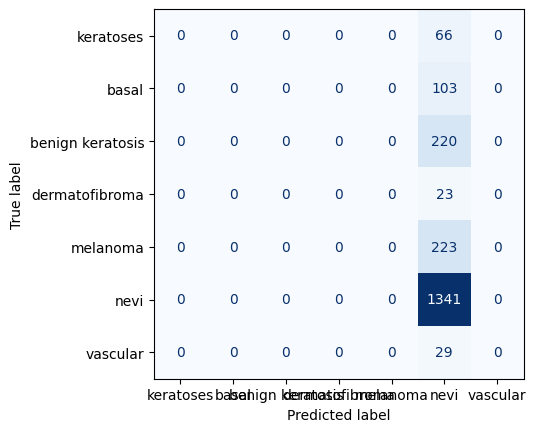

In [52]:
cm = confusion_matrix(y_true_cr, y_pred_cr)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot(cmap='Blues', colorbar=False);

That is not very good. 

How could this be fixed? 

What are the various approaches?

# Fine Tuning

Fine-tuning is the process by which you update or fine-tune a pretrained network to match your particular task. 

# Image Augmentation

Image augmentation is use frequently in deep learning.

Let's take a look at Augmentor to see what augmenation is: <https://github.com/mdbloice/Augmentor>

# Distributing Your Work

There are several reasons why you might want to make a model you have trained available.

## Publishing / Distributing Models

Once you have trained a model, and you wish to publish it, what are your options?

First, by publishing, what do we mean. For example, let's say you were working on a dataset here at the University for a department. You create a model based on the data they have provided for you, and you would like to use this model in an application that the doctors can use. 

In this case, how would you create an application for them to use? 

You could create a tradtional application, perhaps with Java, and then install this on their machines. 

This is problematic for several reasons... 

A better approach might be to create a web application. Some advantages are:

- You only need to provide a URL to the end users
- The web application can run internally on the network and not be on the internet
- Updates that you make are instantly distributed
- No installation required by the end user, no issues with administation rights
- Multi-platform: any device with a web browser can access your application

Let's see how we might do that now.

## Shiny

Shiny is probably the gold standard for creating web applications quickly and easily. However... Shiny is developed for R and not for Python. 

While Shiny might be the best framework to get going with developing a data-centric web application, `R` is not really perfectly suitable for training deep models. Python dominates this field. Therefore, if you were wishing to use some deep models, then R is not really the most suitable language to use. 

If however, you were wishing to provide a new web-based interface for your Python project, it is still possible to use 

However, it is possible to import and run a model that you have trained using Python

For the demonstration below, I used Python along with the Keras framework, to 

![Patho1](./img/fed1.png)

Ignore that fact that the images are MNIST digits! 


The user was required to label these images, and in the background the model is being trained. 

In order to get this up and running, we can load a model that was trained in Python, and read it with 

In this case, I created and trained a model using Keras, which is a high-level library for TensorFlow. We will not cover TensorFlow in this course. The main reason for this is that PyTorch is used more often, and is preferred in academia and research. However, interestingly, Keras now supports PyTorch as a back-end, since version 3, see <https://keras.io/keras_3/> if you are interested. 

Keras provides a package for R, and loading a model that

```R
library(keras)

model <- load_model_hdf5("./vgg19finetuned.h5")

```

You can now access the model and use `predict_classes()`:

```R
predictions <- predict_classes(im)
```

to make predictions based on a network that you trained using Python. 

See <https://cran.r-project.org/web/packages/keras/vignettes/>

Combining R and Python in this way might be a good solution if you prefer to make your web applications using R. I would argue that Shiny is the easiest way to create proper web applications that can be distributed to other users, e.g. on the hospital network. 

![Patho1](./img/fed2.png)

Later we will see how to build a web interface for a model that we have previously trained using Python.

## StreamLit

Now, because the focus of this section of the course is of course Python, we will cover a Python equivalent of Shiny for Python. Several such packages exist, but we shall talk about StreamLit. 

In this section will show how to use StreamLit and demo it for running a pre-trained model. 

## Basics

Streamlit allows you to build web applications using pure Python. It is similar to Shiny. 

Streamlit provides a number of controls, such as buttons, sliders, and so on so that you can interact with the application and the data. 

To start a Streamlit app you just run:

```sh
$ streamlit run script.py
```

from the command line. 

Let's write a very simple app now. We will place the following code in a file called `slider.py`:

```python
import streamlit as st

# Write a title and some text to the app:
st.title('Slider App')
st.write('Demo of Streamlit Interaction')

# Create a slider widget:
value = st.slider('Please select a value:', 0, 100, 50)

# Write the value back to the user:
st.write("You selected the value of ", value, ' using the slider.')
```

We use the element `slider()` element to display the slider, with a minimum of 0, a maximum value of 100, and a default value of 50.

Also notice, it is convention to import Streamlit as `st`, which gives you access to all the Streamlit controls.

>See all the controls that Streamlit has available here: <https://docs.streamlit.io/library/api-reference> and there is also a useful Cheat Sheet: <https://docs.streamlit.io/library/cheatsheet> 
>
>On the left hand side, you will see all the types of elements, such as layout elements and data elements, and so on.

Of course, we can apply functions to the data, so we can modify this script to show your selected value squared, by adding the following function to the script:

```python
def squared(x):
    return x**2
```

and then modify the `st.write()` statement to say the following: 

```python
st.write("I'm ", squared(x), "years old, squared.")`
```

or something similar.

Notice how when we made a change to the source code, the web application noticed this and asked if we'd like to reload the script. 

### Design principles

But how does Streamlit update the `value` in the script above? How does it know when to update it? Normally in JavaScript you'd need to write all these event handlers to do this, for example by manually writing `onClick(e)` event handlers that are executed when events occur. This is quite complicated and requires a lot of coding and knowledge of HTML, JavaScript, and how web applications work.

Streamlit works in the following way: when you start an application, the `streamlit` application watches your web application, and any change to any element, such as a slider, re-runs your entire script again. You have to keep this in mind, that the entire script is re-run. 

This might sound time consuming and slow, especially if there is a calculation that is performed when a user moves a slider, but you can cache results so that a calculation only needs to be run once. If a function that is executed when an element is changed, you can use the `@st.cache_data` decorator to tell Streamlit to cache the results.

#### Displaying Data
Streamlit is focussed on data science and machine learning applications. Therefore the displaying of data is one of its strengths. 

Consider the following application:

```python
"""
# Displaying Data
"""

import streamlit as st
import pandas as pd
df = pd.DataFrame({
  'first column': [1, 2, 3, 4],
  'second column': [10, 20, 30, 40]
})

df
```

Let's save this to a file called `table.py` and run it using `streamlit run table.py` from the command line.

As you can see, you get a lot of interactivity for free. You can search rows, expand cells by double clicking on them, and so on.

If you are in doubt how to display an element, just try `st.write()` and most likely it will work.

Also, plotting is supported, much like in `R`/`Shiny`. For example the following draws a simple plot:

```python
import streamlit as st
import numpy as np
import pandas as pd

chart_data = pd.DataFrame(
     np.random.randn(20, 3),
     columns=['a', 'b', 'c'])

st.line_chart(chart_data)
```

We can save this to `plot.py` and see its output.


Note, that if you wanted to draw a plot, you could generate the plot using MatPlotLib or Seaborn, and just use `st.write()` and it will most likely work. 

For example, for a MatPlotLib plot we could say the following:

```python
import matplotlib.pyplot as plt

arr = np.random.normal(1, 1, size=100)
fig, ax = plt.subplots()
ax.hist(arr, bins=20)

st.write(fig)
```

Note that there is actually a `pyplot()` function, so you would probably want to use `st.pyplot(fig)` instead of `st.write(fig)` but this demonstrates the fleixibility of the `st.write()` function.

So, those are the basics of how Streamlit applications work: you write a Python script, and Streamlit handles the updating of the elements by re-running the script each time the user makes a change to any button, slider, and so on. Of course, in our case, we wish to integrate a trained model with a web application, and we will do this now.

## Integtration With a Trained Model

For any models that you might train during your PhD, or you work at the medical university, you will want to be able to use Streamlit to actually deploy a machine learning based application. This can take several forms, for example:

- An application that allows an expert to label images, such as the example above. This application could also train a model as 
- An application that allows interaction with a trained model, for example one that allows a doctor to query the network for a classification based on an image he or she might upload

In the first scenario you are using the application to train your model and to collect data. In the second scenario you are using a trained model that has you have already prepared.

Step one, let's create a new file, let's call it 'model.py' and add the following code to it:

```python
import torch
from torchvision import models, transforms
from PIL import Image
import numpy as np
import pandas as pd
import streamlit as st

# Set title of app
st.title("Image Classifier)
st.write("Demo application for the ATSP course")

# Enable users to upload images for the model to make predictions
uploaded_file = st.file_uploader("Upload your image", type = "jpg")
```

If we run this we see we have a nice file uplaoder, which let's use choose a file and upload it to the webpage. The `st.file_uploader()` function is doing all the hard work, including telling the browser that only JPEG images are allowed, that there is a 200MB limit, and also returns the uploaded image to the script in the form of `uploaded_file`. 

Also, as we can see we now need to import Torch and Torch Vision, as we are going to load a model previously trained using Torch. 

If we wanted to display this file back to the user, it is a simple case of using `st.image()` (note, you can add code to a running app, and Streamlit will notice a change and ask yo if you want to rerun the application):

```python
if uploaded_file is not None:
    # Display image that user uploaded
    image = Image.open(uploaded_file)
    st.image(image, caption = 'Uploaded Image', use_column_width = True)
    st.write("")
```

Notice also that we included this `if` statement. What we are doing is checking if an image exists. If it exists, that is if the user uploaded the image, then display it. Otherwise display nothing. 

Remember, every time a user interacts with an element, the entire script is re-run. Meaning after the user uploads a file, the script is re-run, this time with an image contained in `uploaded_file` and then the script above will execute.

Now that we have our image, we can load up a model and pass the image to the model. For that we will define a function that will be called when a user uploads an image. Let's just call it `predict()`: 

```python
def predict(image):
    # Return top 5 predictions ranked by highest probability.
    # First create a ResNet model
    resnet = models.resnet101(pretrained = True)

    # Transform the input image through resizing, etc. We have seen this several times in the course already.
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean = [0.485, 0.456, 0.406],
            std = [0.229, 0.224, 0.225]
        )])

    # Load the image, apply preprocessing, and make predictions
    img = Image.open(image)
    single_image_batch = torch.unsqueeze(transform(img), 0)
    resnet.eval()
    out = resnet(single_image_batch)

    # Read the classes file, which contains the 1000 classes of ImageNet
    with open('imagenet_classes.txt') as f:
        classes = [line.strip() for line in f.readlines()]

    # Return the top 5 predictions, ranked by probability
    prob = torch.nn.functional.softmax(out, dim = 1)[0]
    _, indices = torch.sort(out, descending = True)

    return [(classes[i], prob[i].item()) for i in indices[0][:5]]
```

We can place this anywhere in the code, as it will be executed by Streamlit when the app is loaded.

Now we need to display these predictions, which we will do under the image, where we said `if uploaded_file is not None:` previously:

```python
if uploaded_file is not None:

    ...
    
    # Make the prediction
    labels = predict(uploaded_file)
    
    # Format the labels a bit better
    formatted = []
    for i, v in enumerate(labels):
        formatted.append([i+1, v[0].split(',')[1], v[0].split(',')[0], v[1]])
    
    # Save to a Pandas DataFrame
    df = pd.DataFrame(formatted, columns=['Rank', 'Prediction', 'Class Index', 'Probability'])
    df = df.set_index('Rank')
    
    # Show the DataFrame
    st.dataframe(df)
```

Now we can see the results in a Pandas DataFrame. If we wanted to make the table match the size of the parent element, we could use `st.dataframe(df, use_container_width=True)`. 

---

We should think back to our comic that we saw earlier today:

<img src="./img/task.png" width="400"/>

*Source*: <https://xkcd.com/1425/>

And notice that we have come a long way :)

# End of Morning Session

In the next session, we will discuss your assignment. 